## Kaggle related details

Kaggle Installation

In [ ]:
!pip install -q kaggle

Uploading the kaggle.json file

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"prashidikatiwari","key":"56475dcdcf6296fd84b3884a2cf6da56"}'}

Making connection with google colab based on the details of the json

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Downloading and unzipping the dataset

In [ ]:
!kaggle datasets download -d bhavikjikadara/dog-and-cat-classification-dataset
!unzip -q dog-and-cat-classification-dataset.zip

Dataset URL: https://www.kaggle.com/datasets/bhavikjikadara/dog-and-cat-classification-dataset
License(s): apache-2.0


Directories of the actual dataset

In [ ]:
original_dataset_dir = 'PetImages'
categories = ['Cat', 'Dog']

## Making appropriate directories and then arranging the images

In [ ]:
import os
import random
import shutil
from sklearn.model_selection import train_test_split

Creation of 4 different directories

In [ ]:
os.makedirs('data/train/Cat', exist_ok=True)
os.makedirs('data/train/Dog', exist_ok=True)
os.makedirs('data/val/Cat', exist_ok=True)
os.makedirs('data/val/Dog', exist_ok=True)

In [ ]:
for category in ['Cat', 'Dog']:
    all_imgs = os.listdir(f'PetImages/{category}')
    all_imgs = [img for img in all_imgs if os.path.getsize(f'PetImages/{category}/{img}') > 0]

    random.seed(42)
    random.shuffle(all_imgs)
    half_imgs = all_imgs[:len(all_imgs)//2]

    train_imgs, val_imgs = train_test_split(half_imgs, test_size=0.2, random_state=42)

    for img in train_imgs:
        shutil.copy(f'PetImages/{category}/{img}', f'data/train/{category}/{img}')
    for img in val_imgs:
        shutil.copy(f'PetImages/{category}/{img}', f'data/val/{category}/{img}')

## Importing the necessary libraries

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models

from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

import matplotlib.pyplot as plt

In [ ]:
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])
transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

In [ ]:
train_dataset = datasets.ImageFolder('data/train', transform=transform_train)
val_dataset = datasets.ImageFolder('data/val', transform=transform_val)

0


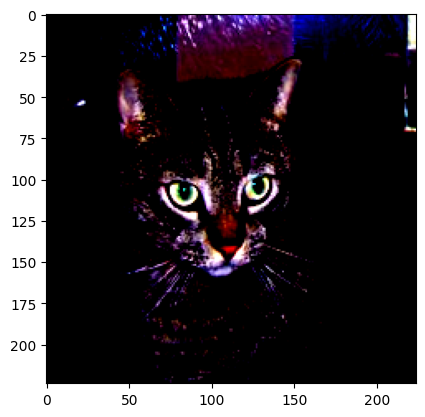

1


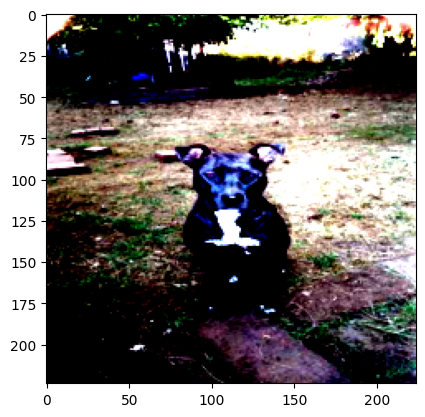

In [ ]:
image1,label1 = train_dataset[0]
image2,label2 = train_dataset[-1]

print(label1)
plt.imshow(image1.permute(1,2,0))
plt.show()

print(label2)
plt.imshow(image2.permute(1,2,0))
plt.show()

In [ ]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)

In [ ]:
print(len(train_loader))
print(len(val_loader))

313
79


### Loading the pre-trained ResNet50 model and altering the linear layer

In [ ]:
model = models.resnet50(pretrained=True)
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 1)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

In [ ]:
from torchsummary import summary
summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

In [ ]:
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

In [ ]:
writer = SummaryWriter("runs/cat_vs_dog")

In [ ]:
num_epochs = 2
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device).view(-1, 1).float() # [B, 1]

        optimizer.zero_grad()
        outputs = model(images)   # [B, 1]
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        probs = torch.sigmoid(outputs)
        preds = (probs > 0.5).float()

        total += labels.size(0)
        correct += (preds == labels).sum().item()

    train_acc = 100 * correct / total
    train_loss = running_loss / len(train_loader)

    # For validation
    model.eval()

    val_loss = 0.0
    val_correct = 0
    val_total   = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            labels = labels.to(device).view(-1, 1).float()

            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item()
            probs = torch.sigmoid(outputs)
            preds = (probs > 0.5).float()

            val_total += labels.size(0)
            val_correct += (preds == labels).sum().item()

    val_acc  = 100 * val_correct / val_total
    val_loss = val_loss / len(val_loader)

    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"Train Loss: {train_loss:.4f},Train Acc: {train_acc:.2f}%")
    print(f" Val  Loss: {val_loss:.4f}, Val  Acc: {val_acc:.2f}%")

    writer.add_scalars("Loss",{"Train": train_loss, "Val": val_loss}, epoch)
    writer.add_scalars("Accuracy",{"Train": train_acc,  "Val": val_acc},  epoch)

Epoch 1/2
Train Loss: 0.0672, Train Acc: 97.71%
 Val  Loss: 0.0370,   Val  Acc: 98.52%
Epoch 2/2
Train Loss: 0.0300, Train Acc: 98.96%
 Val  Loss: 0.0334,   Val  Acc: 98.80%


In [ ]:
%load_ext tensorboard
%tensorboard --logdir=runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

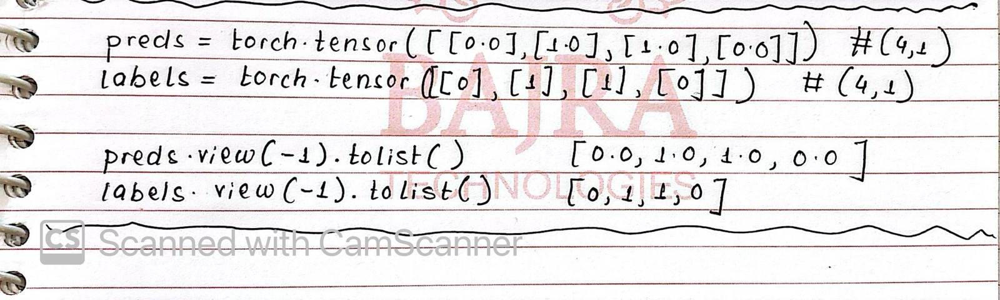

In [ ]:
model.eval()

all_preds = []
all_labels = []
val_loss = 0.0

with torch.no_grad():
    for imgs, labels in val_loader:
        imgs = imgs.to(device)
        labels = labels.to(device).view(-1, 1).float()

        outputs = model(imgs)
        loss = criterion(outputs, labels)
        val_loss += loss.item()

        probs = torch.sigmoid(outputs)
        preds = (probs > 0.5).int()

        all_preds.extend(preds.view(-1).cpu().tolist())
        all_labels.extend(labels.view(-1).cpu().int().tolist())

# compute averages and metrics
avg_val_loss = val_loss / len(val_loader)
prec = precision_score(all_labels, all_preds)
rec = recall_score(all_labels, all_preds)
f1 = f1_score(all_labels, all_preds)
cm = confusion_matrix(all_labels, all_preds)

print(f"Val Loss: {avg_val_loss:.4f} | Precision: {prec:.4f} | Recall: {rec:.4f} | F1: {f1:.4f}")
print("Confusion Matrix:")
print(cm)

Val Loss: 0.0334 | Precision: 0.9864 | Recall: 0.9896 | F1: 0.9880
Confusion Matrix:
[[1233   17]
 [  13 1237]]


In [ ]:
torch.save(model.state_dict(), 'resnet50_cat_vs_dog.pth')
print("Model saved to resnet50_cat_vs_dog.pth")

Model saved to resnet50_cat_vs_dog.pth


In [ ]:
from google.colab import files
files.download('resnet50_cat_vs_dog.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>